In [134]:
# importar as bibliotecas necessárias
import zipfile
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from textblob import TextBlob
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
#from googletrans import Translator
from wordcloud import WordCloud
from PIL import Image
import matplotlib.pyplot as plt
import folium
from geopy.geocoders import Nominatim
#from shiny.express import input, render, ui
from folium.plugins import HeatMap

In [4]:
# Obter os dados
customers = pd.read_csv("https://github.com/fshirahige/deploy_dataviz/raw/main/olist_customers_dataset.csv")
geolocation = pd.read_csv("https://github.com/fshirahige/deploy_dataviz/raw/main/olist_geolocation_dataset.csv")
orders = pd.read_csv("https://github.com/fshirahige/deploy_dataviz/raw/main/olist_orders_dataset.csv")
order_items = pd.read_csv("https://github.com/fshirahige/deploy_dataviz/raw/main/olist_order_items_dataset.csv")
order_payments = pd.read_csv("https://github.com/fshirahige/deploy_dataviz/raw/main/olist_order_payments_dataset.csv")
order_reviews = pd.read_csv("https://github.com/fshirahige/deploy_dataviz/raw/main/olist_order_reviews_dataset.csv")
products = pd.read_csv("https://github.com/fshirahige/deploy_dataviz/raw/main/olist_products_dataset.csv")
sellers = pd.read_csv("https://github.com/fshirahige/deploy_dataviz/raw/main/olist_sellers_dataset.csv")

In [6]:
# 1 Quantas linhas temos na tabela orders?
orders.shape[0]

99441

In [7]:
# 2 Quantas linhas temos na tabela orders_items?
order_items.shape[0]

112650

In [8]:
# 3 Quantas linhas temos na tabela customers?
customers.shape[0]

99441

In [9]:
# 4 Quantas linhas temos na tabela sellers?
sellers.shape[0]

3095

In [10]:
# 5 Quantas linhas temos na tabela products?
products.shape[0]

32951

In [11]:
# 6 Quantas linhas temos na tabela payments?
order_payments.shape[0]

103886

In [12]:
# 7 Quantas linhas temos na tabela orders_reviews?
order_reviews.shape[0]

99224

In [13]:
# 8 Quantas linhas temos na tabela geolocation?
geolocation.shape[0]

1000163

In [14]:
# 9 quantos CEP unicos temos na tabela geolocation?
geolocation['geolocation_zip_code_prefix'].nunique()

19015

In [15]:
# 10 Quantas latitudes e longitudes estão expressas no geolocation?
geolocation['geolocation_lat'].nunique(), geolocation['geolocation_lng'].nunique()

(717360, 717613)

In [16]:
# 11 Crie um metodo para agrupar todas as diferentes latitudes e longitudes que um determinado CEP possui para um valor unico por CEP. Dica Use a funcao group_by e aggragate
geolocation_agrupado = geolocation.groupby('geolocation_zip_code_prefix').agg({'geolocation_lat':'mean', 'geolocation_lng':'mean'}).reset_index()
geolocation_agrupado.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng
0,1001,-23.550190,-46.634024
1,1002,-23.548146,-46.634979
2,1003,-23.548994,-46.635731
3,1004,-23.549799,-46.634757
4,1005,-23.549456,-46.636733


In [17]:
# Transformando as colunas de data (de object para data)
orders['order_purchase_timestamp'] = pd.to_datetime(orders['order_purchase_timestamp'])
orders['order_estimated_delivery_date'] = pd.to_datetime(orders['order_estimated_delivery_date'])
orders['order_delivered_customer_date'] = pd.to_datetime(orders['order_delivered_customer_date'])
orders['order_approved_at'] = pd.to_datetime(orders['order_approved_at'])
orders['order_delivered_carrier_date'] = pd.to_datetime(orders['order_delivered_carrier_date'])

orders['prazo_estimado'] = (orders['order_estimated_delivery_date'] - orders['order_approved_at']).dt.days
orders['prazo_realizado'] = (orders['order_delivered_customer_date'] - orders['order_approved_at']).dt.days
orders['atraso'] = (orders['order_delivered_customer_date'] - orders['order_estimated_delivery_date']).dt.days

#Calculando o prazo médio de entrega
print(f"Prazo estimado médio: {orders.prazo_estimado.mean()}")
print(f"Prazo realizado médio: {orders.prazo_realizado.mean()}")
print(f"Atraso médio: {orders.atraso.mean()}")

Prazo estimado médio: 22.886262225400632
Prazo realizado médio: 11.642968215463084
Atraso médio: -11.876881296902857


In [18]:
# 12 mesclando os dataframes
#Mesclando os df de orders e customers
df = pd.merge(orders, customers, on='customer_id', how='inner')
#Mesclando os df de orders e items
df = pd.merge(df, order_items, on='order_id', how='inner')
#Mesclando os df de orders e sellers
df = pd.merge(df, sellers, on='seller_id', how='inner')
#Mesclando os df de orders e payments
df = pd.merge(df, order_payments, on='order_id', how='inner')
#Mesclando os df de orders e reviews
df = pd.merge(df, order_reviews, on='order_id', how='inner')
#Mesclando os df de orders e products
df = pd.merge(df, products, on='product_id', how='inner')
#Mesclando os df de orders e geolocation (customer = geolocation_zip_code_prefix_x)
df = pd.merge(df, geolocation_agrupado, left_on='customer_zip_code_prefix', right_on='geolocation_zip_code_prefix' , how='left')
#Mesclando os df de orders e geolocation (seller = geolocation_zip_code_prefix_y)
#df = pd.merge(df, geolocation, left_on='seller_zip_code_prefix', right_on='geolocation_zip_code_prefix' , how='left')

In [19]:
orders_100 = orders.head(100000)
print(orders_100.shape)
order_items_100 = order_items.head(100000)
print(order_items_100.shape)
df_100 = pd.merge(order_items_100, orders_100, on='order_id', how='inner')
df_100.shape

(99441, 11)
(100000, 7)


(100000, 17)

In [20]:
# filtrar as orders_id que possuem valores repetidos da coluna order_id em df_100
df_100['order_id'].value_counts().head(20)

8272b63d03f5f79c56e9e4120aec44ef    21
ab14fdcfbe524636d65ee38360e22ce8    20
1b15974a0141d54e36626dca3fdc731a    20
9ef13efd6949e4573a18964dd1bbe7f5    15
428a2f660dc84138d969ccd69a0ab6d5    15
9bdc4d4c71aa1de4606060929dee888c    14
73c8ab38f07dc94389065f7eba4f297a    14
37ee401157a3a0b28c9c6d0ed8c3b24b    13
637617b3ffe9e2f7a2411243829226d0    12
af822dacd6f5cff7376413c03a388bb7    12
3a213fcdfe7d98be74ea0dc05a8b31ae    12
c05d6a79e55da72ca780ce90364abed9    12
2c2a19b5703863c908512d135aa6accc    12
5a3b1c29a49756e75f1ef513383c0c12    11
71dab1155600756af6de79de92e712e3    11
7f2c22c54cbae55091a09a9653fd2b8a    11
6c355e2913545fa6f72c40cbca57729e    11
ca3625898fbd48669d50701aba51cd5f    10
30bdf3d824d824610a49887486debcaf    10
9f5054bd9a3c71702aa0917a7da29193    10
Name: order_id, dtype: int64

In [21]:
# Filtrar orders_id com valor 8272b63d03f5f79c56e9e4120aec44ef
df_100[df_100['order_id'] == '8272b63d03f5f79c56e9e4120aec44ef'].head(5)


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,prazo_estimado,prazo_realizado,atraso
57297,8272b63d03f5f79c56e9e4120aec44ef,1,270516a3f41dc035aa87d220228f844c,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89,fc3d1daec319d62d49bfb5e1f83123e9,delivered,2017-07-16 18:19:25,2017-07-17 18:25:23,2017-07-20 15:45:53,2017-07-31 18:03:02,2017-07-28,10.0,13.0,3.0
57298,8272b63d03f5f79c56e9e4120aec44ef,2,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89,fc3d1daec319d62d49bfb5e1f83123e9,delivered,2017-07-16 18:19:25,2017-07-17 18:25:23,2017-07-20 15:45:53,2017-07-31 18:03:02,2017-07-28,10.0,13.0,3.0
57299,8272b63d03f5f79c56e9e4120aec44ef,3,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89,fc3d1daec319d62d49bfb5e1f83123e9,delivered,2017-07-16 18:19:25,2017-07-17 18:25:23,2017-07-20 15:45:53,2017-07-31 18:03:02,2017-07-28,10.0,13.0,3.0
57300,8272b63d03f5f79c56e9e4120aec44ef,4,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89,fc3d1daec319d62d49bfb5e1f83123e9,delivered,2017-07-16 18:19:25,2017-07-17 18:25:23,2017-07-20 15:45:53,2017-07-31 18:03:02,2017-07-28,10.0,13.0,3.0
57301,8272b63d03f5f79c56e9e4120aec44ef,5,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89,fc3d1daec319d62d49bfb5e1f83123e9,delivered,2017-07-16 18:19:25,2017-07-17 18:25:23,2017-07-20 15:45:53,2017-07-31 18:03:02,2017-07-28,10.0,13.0,3.0


In [22]:
# Filtrar orders_id com valor 8272b63d03f5f79c56e9e4120aec44ef
orders[orders['order_id'] == '8272b63d03f5f79c56e9e4120aec44ef'].head(5)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,prazo_estimado,prazo_realizado,atraso
88849,8272b63d03f5f79c56e9e4120aec44ef,fc3d1daec319d62d49bfb5e1f83123e9,delivered,2017-07-16 18:19:25,2017-07-17 18:25:23,2017-07-20 15:45:53,2017-07-31 18:03:02,2017-07-28,10.0,13.0,3.0


In [23]:
# Filtrar orders_id com valor 8272b63d03f5f79c56e9e4120aec44ef
order_items[order_items['order_id'] == 'ca3625898fbd48669d50701aba51cd5f'].head(20)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
89007,ca3625898fbd48669d50701aba51cd5f,1,1065e0ebef073787a7bf691924c60eeb,0b35c634521043bf4b47e21547b99ab5,2018-08-16 02:25:07,309.0,1.84
89008,ca3625898fbd48669d50701aba51cd5f,2,0cf2faf9749f53924cea652a09d8e327,0b35c634521043bf4b47e21547b99ab5,2018-08-16 02:25:07,33.9,1.84
89009,ca3625898fbd48669d50701aba51cd5f,3,0de59eddc63167215c972b0d785ffa7b,0b35c634521043bf4b47e21547b99ab5,2018-08-16 02:25:07,159.0,3.67
89010,ca3625898fbd48669d50701aba51cd5f,4,0de59eddc63167215c972b0d785ffa7b,0b35c634521043bf4b47e21547b99ab5,2018-08-16 02:25:07,159.0,3.67
89011,ca3625898fbd48669d50701aba51cd5f,5,5dae498eff2d80057f56122235a36aff,888faa8bfb0b159c37de6d898b961c31,2018-08-17 02:25:07,95.9,0.15
89012,ca3625898fbd48669d50701aba51cd5f,6,4a5c3967bfd3629fe07ef4d0cc8c3818,0b35c634521043bf4b47e21547b99ab5,2018-08-16 02:25:07,109.9,0.15
89013,ca3625898fbd48669d50701aba51cd5f,7,678c229b41c0e497d35a25a8be1cc631,888faa8bfb0b159c37de6d898b961c31,2018-08-17 02:25:07,95.9,0.15
89014,ca3625898fbd48669d50701aba51cd5f,8,21b524c4c060169fa75ccf08c7da4627,0b35c634521043bf4b47e21547b99ab5,2018-08-16 02:25:07,63.7,0.15
89015,ca3625898fbd48669d50701aba51cd5f,9,309dd69eb83cea38c51709d62befe1a4,0b35c634521043bf4b47e21547b99ab5,2018-08-16 02:25:07,56.0,3.68
89016,ca3625898fbd48669d50701aba51cd5f,10,309dd69eb83cea38c51709d62befe1a4,0b35c634521043bf4b47e21547b99ab5,2018-08-16 02:25:07,56.0,3.68


In [24]:
order_payments_100 = order_payments.head(100000)
print(order_payments_100.shape)
order_items_100 = order_items.head(100000)
print(order_items_100.shape)
df_100_pay = pd.merge(order_items_100, order_payments_100, on='order_id', how='inner')
df_100_pay.shape

(100000, 5)
(100000, 7)


(100479, 11)

In [25]:
# Filtrar orders_id com valor 8272b63d03f5f79c56e9e4120aec44ef
x = df_100_pay[df_100_pay['order_id'] == 'ca3625898fbd48669d50701aba51cd5f'].head(20)
x

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value
89428,ca3625898fbd48669d50701aba51cd5f,1,1065e0ebef073787a7bf691924c60eeb,0b35c634521043bf4b47e21547b99ab5,2018-08-16 02:25:07,309.0,1.84,1,credit_card,10,1157.28
89429,ca3625898fbd48669d50701aba51cd5f,2,0cf2faf9749f53924cea652a09d8e327,0b35c634521043bf4b47e21547b99ab5,2018-08-16 02:25:07,33.9,1.84,1,credit_card,10,1157.28
89430,ca3625898fbd48669d50701aba51cd5f,3,0de59eddc63167215c972b0d785ffa7b,0b35c634521043bf4b47e21547b99ab5,2018-08-16 02:25:07,159.0,3.67,1,credit_card,10,1157.28
89431,ca3625898fbd48669d50701aba51cd5f,4,0de59eddc63167215c972b0d785ffa7b,0b35c634521043bf4b47e21547b99ab5,2018-08-16 02:25:07,159.0,3.67,1,credit_card,10,1157.28
89432,ca3625898fbd48669d50701aba51cd5f,5,5dae498eff2d80057f56122235a36aff,888faa8bfb0b159c37de6d898b961c31,2018-08-17 02:25:07,95.9,0.15,1,credit_card,10,1157.28
89433,ca3625898fbd48669d50701aba51cd5f,6,4a5c3967bfd3629fe07ef4d0cc8c3818,0b35c634521043bf4b47e21547b99ab5,2018-08-16 02:25:07,109.9,0.15,1,credit_card,10,1157.28
89434,ca3625898fbd48669d50701aba51cd5f,7,678c229b41c0e497d35a25a8be1cc631,888faa8bfb0b159c37de6d898b961c31,2018-08-17 02:25:07,95.9,0.15,1,credit_card,10,1157.28
89435,ca3625898fbd48669d50701aba51cd5f,8,21b524c4c060169fa75ccf08c7da4627,0b35c634521043bf4b47e21547b99ab5,2018-08-16 02:25:07,63.7,0.15,1,credit_card,10,1157.28
89436,ca3625898fbd48669d50701aba51cd5f,9,309dd69eb83cea38c51709d62befe1a4,0b35c634521043bf4b47e21547b99ab5,2018-08-16 02:25:07,56.0,3.68,1,credit_card,10,1157.28
89437,ca3625898fbd48669d50701aba51cd5f,10,309dd69eb83cea38c51709d62befe1a4,0b35c634521043bf4b47e21547b99ab5,2018-08-16 02:25:07,56.0,3.68,1,credit_card,10,1157.28


In [26]:
x['price'].sum() + x['freight_value'].sum()

1157.28

In [27]:
# 13 Quantas ordens distintas temos em nosso banco de dados?
df['order_id'].nunique()

97916

In [28]:
# 14 Quantos clientes distintos existem em nosso banco de dados?
df['customer_id'].nunique()

97916

In [29]:
# 15 Quantos vendedores distintos existem em nosso bando de dados?
df['seller_id'].nunique()

3090

In [30]:
# 16 Qual a porcentagem de vendas feitas com cartao de credito?
# 17 Qual a porcentagem de vendas feitas com cartao de debito?
df['payment_type'].value_counts(normalize=True)*100


credit_card    73.741360
boleto         19.462367
voucher         5.354175
debit_card      1.442099
Name: payment_type, dtype: float64

In [31]:
# 16.1 Qual a porcentagem do valor das vendas feitas com cartao de credito?
# 17.1 Qual a porcentagem do valor das vendas feitas com cartao de debito?
df.groupby('payment_type')['payment_value'].sum()/df['payment_value'].sum()*100


payment_type
boleto         20.023362
credit_card    76.719528
debit_card      1.257839
voucher         1.999271
Name: payment_value, dtype: float64

In [32]:
#18 Qual a porcentagem de reviews com 2 estrelas temos em nossa base?
df['review_score'].value_counts(normalize=True)*100


5    56.477086
4    18.994451
1    12.660127
3     8.386673
2     3.481663
Name: review_score, dtype: float64

In [33]:
#19 Quantas categorias de produto distintas existem em nossa base?
df['product_category_name'].nunique()

73

In [34]:
#20 Qual a média de review por categoria de produto?
review_produtos = df.groupby('product_category_name')['review_score'].mean().sort_values(ascending=False)
review_produtos

product_category_name
cds_dvds_musicais                                4.642857
fashion_roupa_infanto_juvenil                    4.500000
livros_interesse_geral                           4.438503
flores                                           4.419355
livros_importados                                4.419355
                                                   ...   
moveis_escritorio                                3.526791
portateis_cozinha_e_preparadores_de_alimentos    3.266667
fraldas_higiene                                  3.256410
pc_gamer                                         3.100000
seguros_e_servicos                               2.500000
Name: review_score, Length: 73, dtype: float64

In [35]:
# 21 Quais as 5 categorias que mais possuem produtos em nossa base?
df['product_category_name'].value_counts().head(5)

cama_mesa_banho           11847
beleza_saude               9944
esporte_lazer              8942
moveis_decoracao           8743
informatica_acessorios     8105
Name: product_category_name, dtype: int64

In [36]:
#22 Quantos comentarios existem na base?
df['review_comment_message'].count()


49679

In [37]:
# Quantos comentários únicos existem na base?
df['review_comment_message'].nunique()

35691

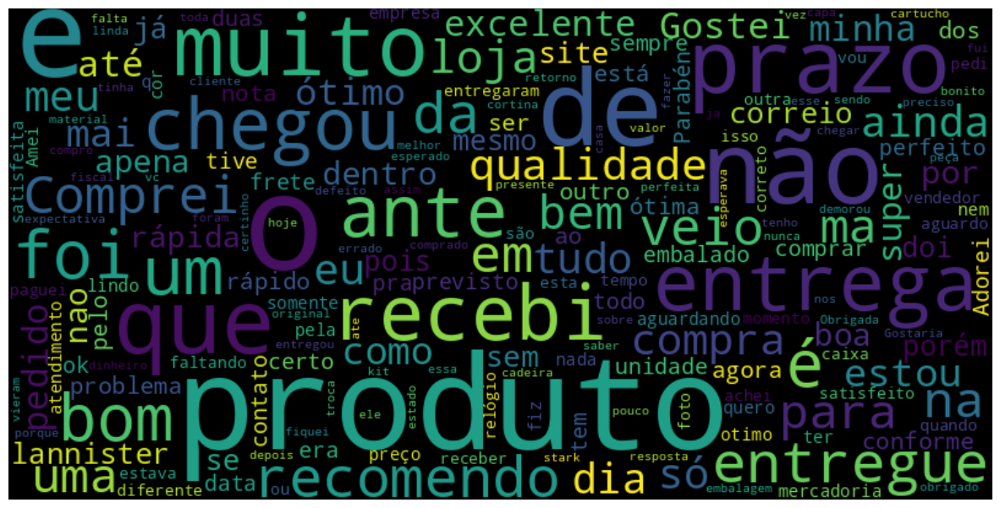

In [38]:
# 23 Crie uma nuvem de palavras que mostre as principais informacoes contidadas nos comentarios
reviews = df['review_comment_message'].dropna()
reviews = ' '.join(reviews)
wordcloud = WordCloud(width=800, height=400, max_font_size=110, collocations=False).generate(reviews)
plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [39]:
# 24 Qual a porcentagem de ordens entregues?
df['order_status'].value_counts(normalize=True)*100

delivered      97.894809
shipped         0.994639
canceled        0.471324
processing      0.315353
invoiced        0.315353
unavailable     0.005966
approved        0.002557
Name: order_status, dtype: float64

In [40]:
# 25 Qual o tempo medio entre a compra e a aprovacao da compra?

df['tempo_aprovacao'] = (df['order_approved_at'] - df['order_purchase_timestamp']).dt.days
df['tempo_aprovacao'].mean()

0.27130606747702746

In [41]:
# 26 Qual o tempo medio entre a compra e a entrega?
df['tempo_entrega'] = (df['order_delivered_customer_date'] - df['order_purchase_timestamp']).dt.days
df['tempo_entrega'].mean()

11.979374532030855

In [42]:
# tempo medio entre a compra e a entrega por estado
tempo_entrega_estado = df.groupby('customer_state')['tempo_entrega'].mean().sort_values(ascending=False)
tempo_entrega_estado

customer_state
RR    27.826087
AP    27.621951
AM    26.005917
AL    24.054299
PA    23.019517
MA    21.050184
SE    20.744792
CE    20.285237
AC    20.170213
PB    19.872964
RO    19.235714
RN    19.153846
PI    18.908759
BA    18.668710
PE    17.700000
MT    17.436975
TO    16.678679
ES    15.090512
MS    15.063830
GO    14.902119
RJ    14.712624
RS    14.683825
SC    14.407848
DF    12.495266
PR    11.507669
MG    11.476201
SP     8.256370
Name: tempo_entrega, dtype: float64

In [43]:
# 27 Qual a diferenca media entre a data prevista de entrega e a data efetiva de entrega?
df['atraso'].mean()

-12.08457399571645

In [44]:
# 28 Em qual periodo do dia as pessoas mais costumam fazer compras por estado? Divida entre manha, tarde e noite.
df['periodo_compra'] = df['order_purchase_timestamp'].dt.hour
df['periodo_compra'] = pd.cut(df['periodo_compra'], bins=[0, 6, 12, 18, 24], labels=['madrugada', 'manha', 'tarde', 'noite'])
df.groupby('periodo_compra')['customer_state'].value_counts(normalize=True).unstack().idxmax()


customer_state
AC    madrugada
AL    madrugada
AM        tarde
AP    madrugada
BA        noite
CE        manha
DF        tarde
ES        manha
GO        tarde
MA    madrugada
MG        manha
MS        tarde
MT        manha
PA    madrugada
PB    madrugada
PE    madrugada
PI        manha
PR        tarde
RJ    madrugada
RN        manha
RO    madrugada
RR        tarde
RS        noite
SC        noite
SE    madrugada
SP    madrugada
TO        manha
dtype: object

In [45]:
# 29 Quais os diferentes tipos de dados temos em nossa tabela?
df.dtypes

order_id                                 object
customer_id                              object
order_status                             object
order_purchase_timestamp         datetime64[ns]
order_approved_at                datetime64[ns]
order_delivered_carrier_date     datetime64[ns]
order_delivered_customer_date    datetime64[ns]
order_estimated_delivery_date    datetime64[ns]
prazo_estimado                          float64
prazo_realizado                         float64
atraso                                  float64
customer_unique_id                       object
customer_zip_code_prefix                  int64
customer_city                            object
customer_state                           object
order_item_id                             int64
product_id                               object
seller_id                                object
shipping_limit_date                      object
price                                   float64
freight_value                           

In [46]:
# 30 Quantos clientes distintos temos por estado?
df.groupby('customer_state')['customer_id'].nunique().sort_values(ascending=False)

customer_state
SP    41108
RJ    12598
MG    11466
RS     5412
PR     4972
SC     3584
BA     3319
DF     2115
ES     1998
GO     1994
PE     1631
CE     1317
PA      957
MT      896
MA      735
MS      707
PB      526
PI      488
RN      478
AL      408
SE      344
TO      278
RO      246
AM      145
AC       81
AP       67
RR       46
Name: customer_id, dtype: int64

In [47]:
# 31 Quantos vendedores distintos temos por estado?
df.groupby('customer_state')['seller_id'].nunique().sort_values(ascending=False)

customer_state
SP    2545
RJ    1742
MG    1658
RS    1230
PR    1230
SC    1033
BA     958
DF     784
ES     731
GO     719
PE     634
CE     525
MT     465
PA     458
MS     402
MA     372
PB     302
PI     296
RN     275
AL     250
SE     211
TO     198
RO     181
AM     116
AC      71
AP      62
RR      39
Name: seller_id, dtype: int64

In [48]:
# Crie uma coluna com a regiao metropolitana de São Paulo (região metrolpolitana de SP é considerada para prefixo de CEPs menores que 10000)
df['regiao_metropolitana_SP'] = np.where(df['customer_zip_code_prefix'] < 10000, 'Grande Sao Paulo', 'Outros')
# 32 Quantos clientes distintos temos na regiao metropolitana de Sao Paulo?
df[df['regiao_metropolitana_SP'] == 'Grande Sao Paulo']['customer_id'].nunique()


23620

In [49]:
# 33 Qual a media de valor, por estado, que os clientes atribuem aos vendedores?
df.groupby('customer_state')['review_score'].mean().sort_values(ascending=False)


customer_state
AP    4.240964
TO    4.142012
SP    4.127102
PR    4.106226
AC    4.094737
MG    4.086222
AM    4.082353
MS    4.076112
RN    4.054770
RS    4.039134
RO    4.035088
SC    4.003035
DF    4.002820
PB    4.001590
GO    3.986755
ES    3.985770
PE    3.965352
MT    3.895255
PI    3.852113
SE    3.827848
CE    3.823301
BA    3.819631
RJ    3.813206
PA    3.795826
AL    3.718954
MA    3.682088
RR    3.576923
Name: review_score, dtype: float64

In [50]:
# 34 Qual o valor medio de frete cobrado por estado ordenado do maior para o menor:
df.groupby('customer_state')['freight_value'].mean().sort_values(ascending=False)

customer_state
PB    43.319571
RR    42.984423
RO    41.039719
AC    40.021684
TO    39.742101
PI    39.189401
MA    38.216287
SE    36.182810
PA    35.631534
AL    35.623617
RN    35.138675
AP    34.200120
AM    33.118765
PE    32.786743
CE    32.511385
MT    28.987592
BA    26.355147
MS    23.333103
GO    22.825745
ES    21.907210
RS    21.804345
SC    21.401539
RJ    21.089723
DF    21.080044
PR    20.605068
MG    20.593766
SP    15.196392
Name: freight_value, dtype: float64

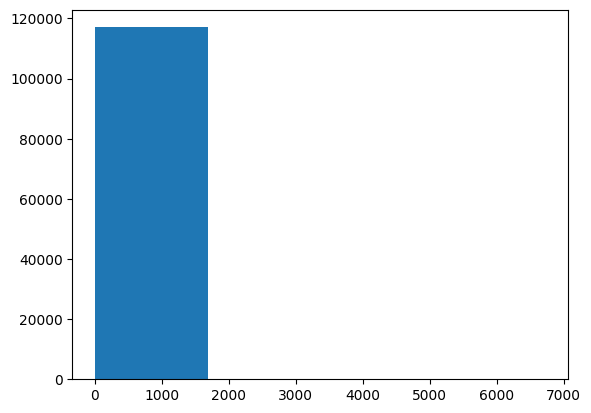

In [51]:
# 35 Faça um histograma de precos divididos em 4 quantis.
plt.hist(df['price'], bins=4)
plt.show()


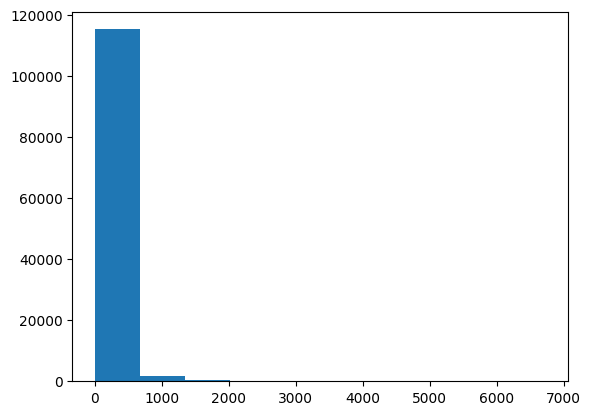

In [52]:
# 36 Trace um histograma de preços divididos em 10 quantis
plt.hist(df['price'], bins=10)
plt.show()

In [53]:
# 37 Qual a porcentagem de vendas é feita no estado de São Paulo e estão no primeiro quartil?
df['quartil'] = pd.qcut(df['payment_value'], 4, labels=['Q1', 'Q2', 'Q3', 'Q4'])
q1_SP = df[(df['customer_state'] == 'SP') & (df['quartil'] == 'Q1')].shape[0]/df.shape[0]*100
q1_SP

12.599613053891195

In [54]:
# 38 Qual o valor medio das compras no primeiro quartil?
media_q1 = df[df['quartil'] == 'Q1']['payment_value'].mean()
media_q1

38.723830925446364

In [55]:
# 39 Considerando uma base de 6.000.000 de clientes na Olist, qual a quantidade de clientes no primeiro quartil e de Sao Paulo podemos atingir?
q1_SP * 6000000/100


755976.7832334717

In [56]:
# 40 Qual o TAM (Tamanho de Mercado) no contexto descrito anteriormente?
media_q1 * q1_SP/100 * 6000000

29274317.137495775

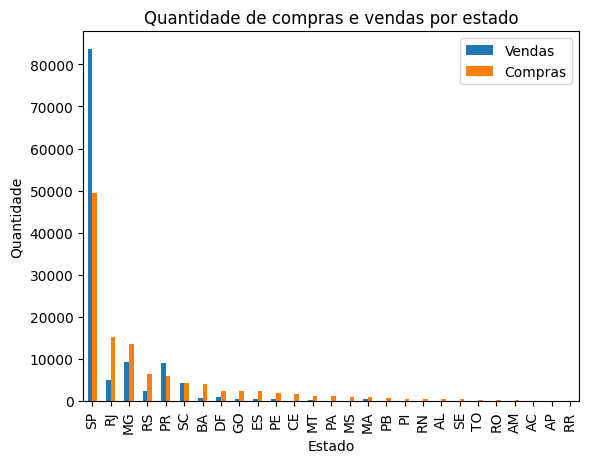

In [57]:
#Quantidade de vendas por estado
vendas_estado = df['seller_state'].value_counts()
# conveter para dataframe
vendas_estado = vendas_estado.reset_index()
vendas_estado.columns = ['Estado', 'Vendas']
#quantidade de compras por estado
compras_estado = df['customer_state'].value_counts()
# conveter para dataframe
compras_estado = compras_estado.reset_index()
compras_estado.columns = ['Estado', 'Compras']

#Mescar os dataframes
df_compra_venda = pd.merge(compras_estado, vendas_estado, on='Estado', how='left')

# Grafico com a quantidade de compras e vendas por estado do df_compra_venda
fig, ax = plt.subplots()
df_compra_venda.plot(kind='bar', x='Estado', y=['Vendas', 'Compras'], ax=ax)
ax.set_ylabel('Quantidade')
ax.set_xlabel('Estado')
ax.set_title('Quantidade de compras e vendas por estado')
plt.show()

In [58]:
# percentual de reviews com nota 1 por estado
df['review_score_1'] = np.where(df['review_score'] == 1, 1, 0)
df.groupby('customer_state')['review_score_1'].mean().sort_values(ascending=False)*100

customer_state
RR    21.153846
MA    19.572954
AL    18.518519
RJ    18.409987
SE    17.721519
PA    16.878403
CE    16.440129
PI    15.845070
BA    15.595416
MT    14.771710
PE    14.498934
ES    13.454075
DF    13.376309
SC    12.981555
PB    12.559618
GO    12.541391
RS    12.523020
RN    12.190813
MS    11.709602
MG    11.435076
PR    11.042121
SP    10.630565
AM     9.411765
RO     9.122807
TO     8.284024
AC     7.368421
AP     4.819277
Name: review_score_1, dtype: float64

In [59]:
# Criar um dataframe com os dados de compras de clientes do RJ
df_rj = df[df['customer_state'] == 'RJ']
df_rj.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,prazo_estimado,prazo_realizado,...,product_width_cm,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,tempo_aprovacao,tempo_entrega,periodo_compra,regiao_metropolitana_SP,quartil,review_score_1
10,e37531db8933bdce0f86e9dc3768759e,74380820e581b5e8585abc1b5e11c079,delivered,2017-08-07 21:48:23,2017-08-07 22:25:11,2017-08-08 13:00:00,2017-08-16 11:42:26,2017-08-29,21.0,8.0,...,15.0,21340.0,-22.871018,-43.356845,0.0,8.0,noite,Outros,Q2,0
42,60d13096e69ace88a0c5b8c3805010ca,54bd7edf8250e9e67794e9df507e3720,delivered,2017-11-06 13:48:10,2017-11-07 07:30:35,2017-11-10 14:24:33,2017-11-18 12:21:41,2017-11-28,20.0,11.0,...,19.0,28016.0,-21.765592,-41.282021,0.0,11.0,tarde,Outros,Q1,0
45,f8b3a190c48ca5261da8494b51c540bd,54ac14c3edc253de071e90f1e541bffc,delivered,2017-11-05 15:56:14,2017-11-05 16:10:28,2017-11-06 19:33:24,2017-11-14 22:59:46,2017-11-28,22.0,9.0,...,34.0,28621.0,-22.323429,-42.547614,0.0,9.0,tarde,Outros,Q2,0
48,0010b2e5201cc5f1ae7e9c6cc8f5bd00,57ef317d4818cb42680fc9dfd13867ce,delivered,2017-09-11 17:39:33,2017-09-11 18:04:37,2017-09-12 17:02:57,2017-09-23 13:21:21,2017-09-27,15.0,11.0,...,34.0,22461.0,-22.961345,-43.213641,0.0,11.0,tarde,Outros,Q2,0
57,6f4e7312027dba2bba5c1b75addfd1ef,db76a08441e64f32ac64a72161893227,delivered,2017-07-19 08:52:47,2017-07-19 22:35:12,2017-07-20 14:49:27,2017-07-27 16:43:34,2017-08-10,21.0,7.0,...,34.0,27945.0,-22.372457,-41.794318,0.0,8.0,manha,Outros,Q1,0


In [60]:
# tempo de entrega médio do vendendor por estado no df_rj
tempo_entrega_vendedor_estado = df_rj.groupby('seller_state')['tempo_entrega'].mean().sort_values(ascending=False)
tempo_entrega_vendedor_estado

seller_state
RN    27.000000
RO    19.000000
MA    16.809524
CE    16.800000
PR    16.326334
SP    15.647524
SC    15.573770
MT    14.642857
PB    14.125000
MG    13.928254
DF    13.924528
GO    13.761905
RS    13.599278
PE    13.301887
BA    12.715789
ES    11.866667
MS    11.000000
SE     8.000000
RJ     6.054709
PI          NaN
Name: tempo_entrega, dtype: float64

In [61]:
# Maiores vendedores para o RJ (df_rj)
estados_vendedores_valor = df_rj.groupby('seller_state')['payment_value'].sum().sort_values(ascending=False)
estados_vendedores_valor

seller_state
SP    1768228.85
RJ     236463.04
MG     222674.68
PR     216168.59
SC     106810.11
RS      64568.21
BA      43082.74
ES      17970.64
PE      17657.22
DF      16744.36
GO       7860.49
PB       5899.75
MA       4743.31
CE       4514.32
MT       2758.15
MS       2025.90
RO       1906.97
RN        908.92
PI        173.77
SE        128.08
Name: payment_value, dtype: float64

In [62]:
# custo médio do frete por estado no df_rj
frete_estado = df_rj.groupby('seller_state')['freight_value'].mean().sort_values(ascending=False)
frete_estado

seller_state
CE    59.746000
PB    58.348889
RO    53.495000
SE    38.180000
RN    35.010000
PI    34.770000
MT    33.793571
BA    31.480825
MA    29.748095
RS    28.343345
SC    26.583255
ES    26.111688
PE    25.768868
GO    24.725781
MG    24.565723
PR    22.539362
MS    22.004444
DF    20.783604
SP    20.611957
RJ    12.368890
Name: freight_value, dtype: float64

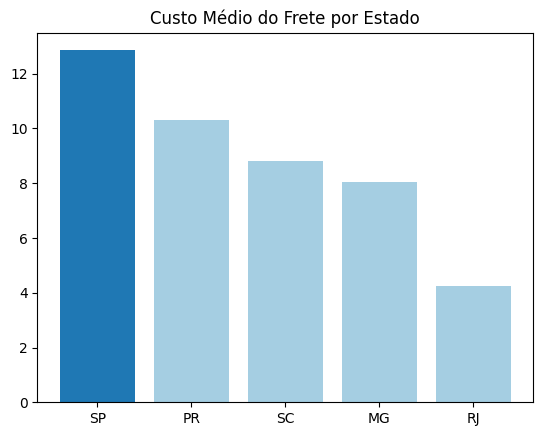

In [63]:
# Faça o gráfico do custo médio do frete por estado no df_rj. Considere o top 5 estados com maior valor de vendas
top_5_estados = df_rj['seller_state'].value_counts().head(5).index
df_rj_top_5 = df_rj[df_rj['seller_state'].isin(top_5_estados)]
frete_estado = df_rj_top_5.groupby('seller_state')['freight_value'].mean().sort_values(ascending=False)
atraso_estado = df_rj_top_5[df_rj_top_5['atraso'] > 0]['seller_state'].value_counts()/df_rj_top_5['seller_state'].value_counts()*100
frete_estado = atraso_estado.sort_values(ascending=False)


plt.bar(frete_estado.index, frete_estado.values, color='#a5cee2')


indice_destacado =  frete_estado.index.get_loc('SP')
cores = ['#a5cee2' if i != indice_destacado else '#1f78b4' for i in range(len(frete_estado.index))]
plt.bar(frete_estado.index[indice_destacado], frete_estado.values[indice_destacado], color=cores[indice_destacado])
plt.title('Custo Médio do Frete por Estado')


plt.show()



In [64]:
# Media do preço do frete por peso por estado no df_rj
df_rj['frete_por_peso'] = df_rj['freight_value']/df_rj['product_weight_g']
frete_peso = df_rj.groupby('seller_state')['frete_por_peso'].mean().sort_values(ascending=False)
frete_peso

<ipython-input-64-ed525a01ed62>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rj['frete_por_peso'] = df_rj['freight_value']/df_rj['product_weight_g']


seller_state
GO    0.074094
MA    0.070709
DF    0.060417
PB    0.059059
PR    0.052890
RS    0.051047
PE    0.050469
BA    0.047453
SP    0.037331
SC    0.032980
MG    0.032908
RJ    0.029471
PI    0.028975
MT    0.028861
SE    0.027271
RO    0.024486
CE    0.017266
RN    0.016679
ES    0.009684
MS    0.008932
Name: frete_por_peso, dtype: float64

In [65]:
# qual é o preço médio dos produtos por estado no df_rj
preco_produto = df_rj.groupby('seller_state')['price'].mean().sort_values(ascending=False)
preco_produto

seller_state
RO    899.990000
PB    597.178889
RN    419.450000
CE    391.686000
BA    379.073299
MS    203.095556
RS    184.426584
PE    182.618491
RJ    165.419081
SC    157.948237
MT    140.035714
PI    139.000000
ES    131.738052
PR    130.363013
DF    118.736667
MG    116.488289
SP    113.136114
GO     97.903750
SE     89.900000
MA     80.894762
Name: price, dtype: float64

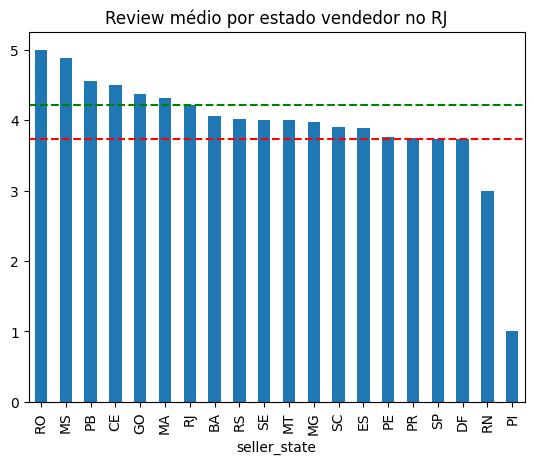

In [66]:
# Grafico Review médio por estado vendedor no df_rj ordenado do maior para o menor. Destacar as barras dos estados de SP e RJ
review_vendedor = df_rj.groupby('seller_state')['review_score'].mean().sort_values(ascending=False)
review_vendedor.plot(kind='bar')
plt.axhline(review_vendedor['SP'], color='r', linestyle='--')
plt.axhline(review_vendedor['RJ'], color='g', linestyle='--')
plt.title('Review médio por estado vendedor no RJ')
plt.show()



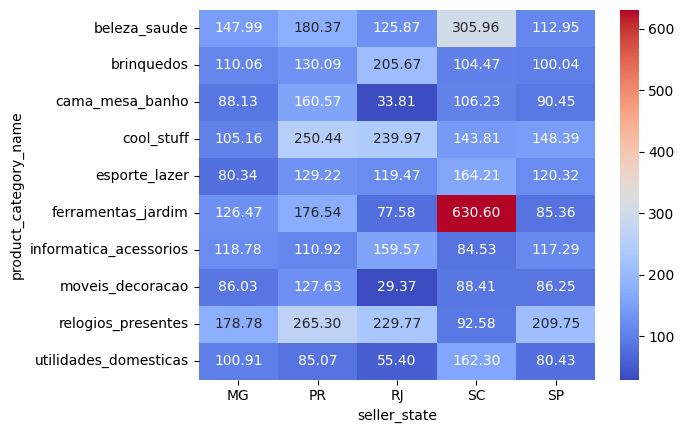

In [67]:
# Calcule o preço medio por produto e por estado dos top 10 produtos mais vendidos e dos top 3 estados vendedores no df_rj e plote numa matrix de calor
top_10_produtos = df_rj['product_category_name'].value_counts().head(10).index
top_5_estados = df_rj['seller_state'].value_counts().head(5).index
df_rj_top_10 = df_rj[df_rj['product_category_name'].isin(top_10_produtos)]
df_rj_top_10 = df_rj_top_10[df_rj_top_10['seller_state'].isin(top_5_estados)]
preco_medio = df_rj_top_10.groupby(['product_category_name', 'seller_state'])['price'].mean().unstack()
sns.heatmap(preco_medio, annot=True, fmt=".2f", cmap='coolwarm')
plt.show()

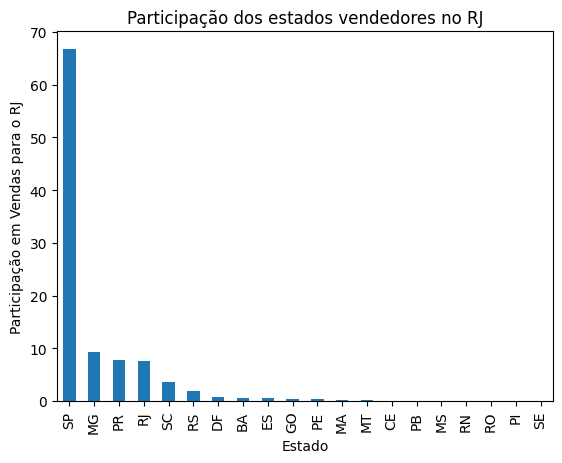

In [68]:
# Grafico de barras com a participação dos estados vendedores no df_rj ordenado do maior para o menor. Colocar um título e um label para o eixo x e eixo y
estados_vendedores = df_rj['seller_state'].value_counts(normalize=True)*100
estados_vendedores.plot(kind='bar')
plt.title('Participação dos estados vendedores no RJ')
plt.xlabel('Estado')
plt.ylabel('Participação em Vendas para o RJ')
plt.show()

In [69]:
#A desvio padrão do Review por estado vendedor no df_rj
desvio_review_vendedor = df_rj.groupby('seller_state')['review_score'].std().sort_values(ascending=False)
desvio_review_vendedor


seller_state
RN    2.828427
PR    1.587707
SP    1.577198
MT    1.568929
DF    1.566385
ES    1.518174
RS    1.498771
SC    1.494952
PE    1.492361
MG    1.437326
BA    1.352578
RJ    1.345117
PB    1.333333
CE    1.269296
MA    1.239357
GO    1.227981
MS    0.333333
RO    0.000000
PI         NaN
SE         NaN
Name: review_score, dtype: float64

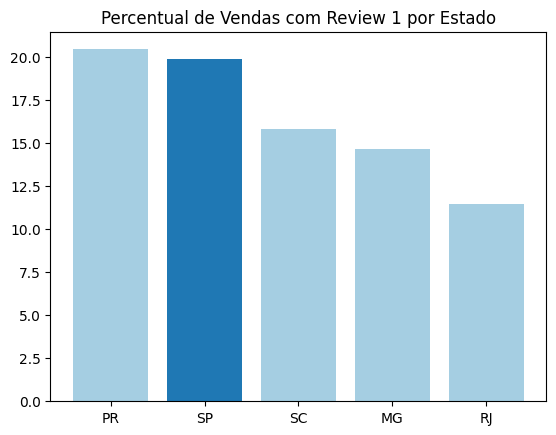

In [70]:
# Grafico com Percentual das vendas com reviews de nota 1 por estados no df_rj. Considerar somente os top 5 estados com mais vendas. Destacar a barra do estado de SP com uma cor diferente
top_5_estados = df_rj['seller_state'].value_counts().head(5).index
df_rj_top_5 = df_rj[df_rj['seller_state'].isin(top_5_estados)]
review_1_estado = df_rj_top_5.groupby('seller_state')['review_score_1'].mean().sort_values(ascending=False)*100


plt.bar(review_1_estado.index, review_1_estado.values, color='#a5cee2' )


indice_destacado =  review_1_estado.index.get_loc('SP')
cores = ['#a5cee2'  if i != indice_destacado else '#1f78b4' for i in range(len(review_1_estado.index))]
plt.bar(review_1_estado.index[indice_destacado], review_1_estado.values[indice_destacado], color=cores[indice_destacado])
plt.title('Percentual de Vendas com Review 1 por Estado')


plt.show()


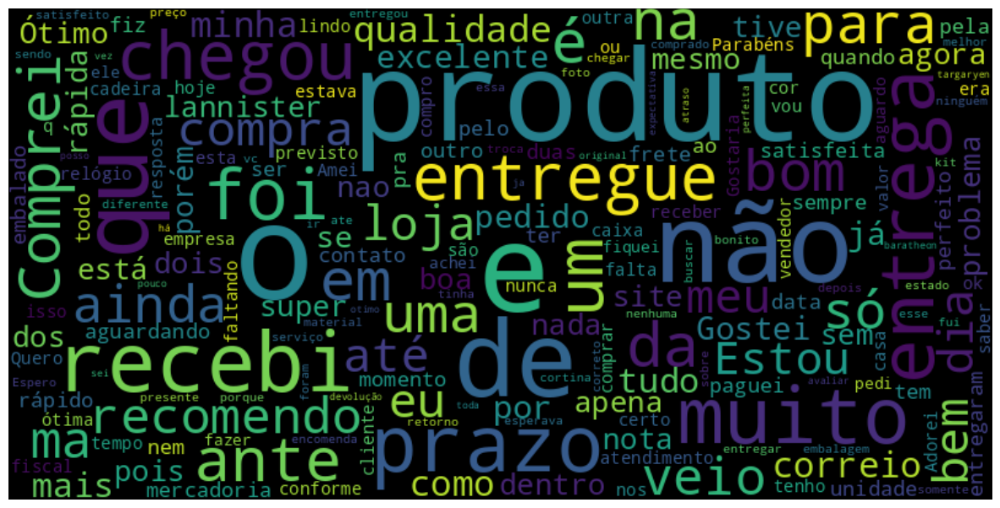

In [71]:
# Nuvem de palavras dos comentários dos clientes do RJ no df_rj
reviews_rj = df_rj['review_comment_message'].dropna()
reviews_rj = ' '.join(reviews_rj)
wordcloud = WordCloud(width=800, height=400, max_font_size=110, collocations=False).generate(reviews_rj)
plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [72]:
#quais são os comentários mais comuns dos clientes do RJ no df_rj
reviews_rj = df_rj['review_comment_message'].dropna()
reviews_rj.value_counts().head(10)


Muito bom               33
Bom                     31
Recomendo               18
Excelente               16
bom                     15
Não recebi o produto    12
otimo                   12
Ótimo                   11
Recomendo               10
Otimo                   10
Name: review_comment_message, dtype: int64

In [73]:
reviews_title_rj = df_rj['review_comment_title'].dropna()
reviews_title_rj.value_counts().head(15)

Recomendo          66
Bom                59
Excelente          40
Muito bom          38
recomendo          38
super recomendo    32
Ótimo              31
Super recomendo    23
Ótimo              22
Ruim               19
Otimo              18
10                 18
Excelente          18
RECOMENDO          16
bom                14
Name: review_comment_title, dtype: int64

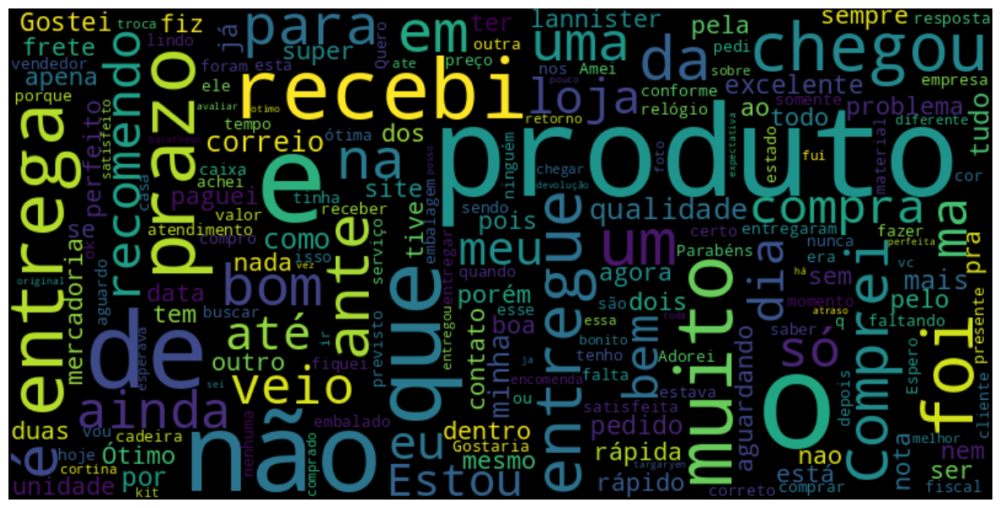

In [74]:
# Nuvem de palavras dos comentários dos clientes do RJ no df_rj
reviews_title_rj = ' '.join(reviews_rj)
wordcloud = WordCloud(width=800, height=400, max_font_size=110, collocations=False).generate(reviews_title_rj)
plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

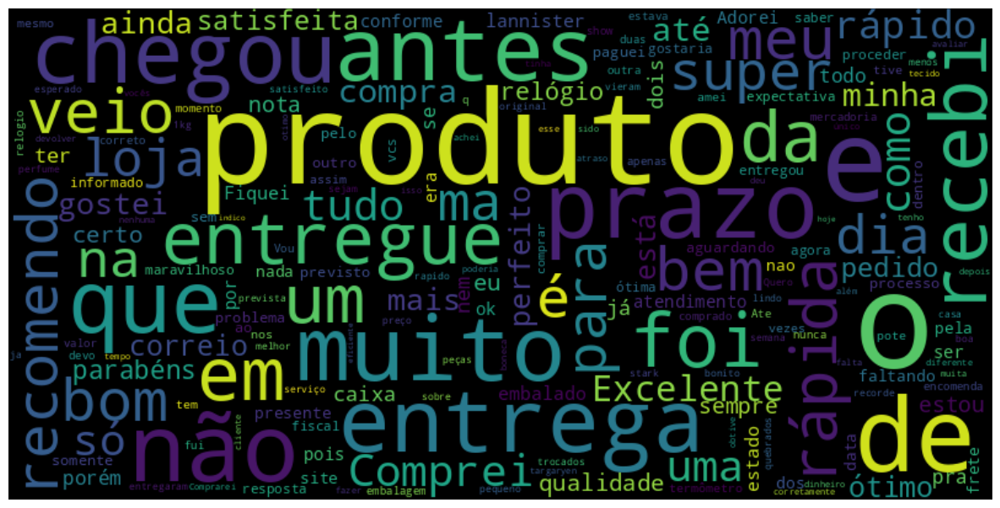

In [75]:
# Nuvem de palavras dos comentários dos clientes do RJ no df_rj considerando somente os vendedores do RJ
df_rj_vendedor_rj = df_rj[df_rj['seller_state'] == 'RJ']
reviews_rj_vendedor_rj = df_rj_vendedor_rj['review_comment_message'].dropna()
reviews_rj_vendedor_rj = ' '.join(reviews_rj_vendedor_rj)
wordcloud = WordCloud(width=800, height=400, max_font_size=110, collocations=False).generate(reviews_rj_vendedor_rj)
plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [76]:
# Top 3 produtos vendidos para o RJ no df_rj cuja origem é GO
df_rj_go = df_rj[df_rj['seller_state'] == 'GO']
df_rj_go['product_category_name'].value_counts().head(3)


esporte_lazer            10
dvds_blu_ray              9
utilidades_domesticas     8
Name: product_category_name, dtype: int64

In [77]:
#Principais produtos vendidos para o RJ no df_rj
df_rj['product_category_name'].value_counts().head(10)

cama_mesa_banho           1761
moveis_decoracao          1151
beleza_saude              1098
esporte_lazer             1082
informatica_acessorios    1032
utilidades_domesticas      929
relogios_presentes         878
ferramentas_jardim         692
brinquedos                 595
cool_stuff                 532
Name: product_category_name, dtype: int64

In [78]:
# quanto representam no total de vendas os prodtuos mais vendidos para o RJ no df_rj
df_rj['product_category_name'].value_counts(normalize=True).head(10)*100


cama_mesa_banho           11.747832
moveis_decoracao           7.678452
beleza_saude               7.324883
esporte_lazer              7.218145
informatica_acessorios     6.884590
utilidades_domesticas      6.197465
relogios_presentes         5.857238
ferramentas_jardim         4.616411
brinquedos                 3.969313
cool_stuff                 3.549033
Name: product_category_name, dtype: float64

In [79]:
# Os titulos dos comentários dos clientes cujo review é 1 no df_rj
reviews_title_1 = df_rj[df_rj['review_score'] == 1]['review_comment_title'].dropna()
reviews_title_1.value_counts().head(20)

Não recomendo              11
Produto errado             10
Ruim                       10
Entrega incompleta          7
Produto não entregue        6
Não recomendo               6
Não recebi o produto        6
PÉSSIMO ATENDIMENTO         5
Insatisfação                5
Estou aguardando.           5
Entrega                     4
Bom                         4
não recomendo               4
NÃO RECEBI O PRODUTO        4
produto nao e original      3
Zero nota zero              3
encomenda                   3
Pedido veio incompleto      3
Não recebi                  3
Péssimo                     3
Name: review_comment_title, dtype: int64

In [80]:
# Os comentários mais frequentes dos clientes cujo review é 1 no df_rj
reviews_1 = df_rj[df_rj['review_score'] == 1]['review_comment_message'].dropna()
reviews_1.value_counts().head(30)


Não recebi o produto                                                                                                                                                                                        11
Peço por favor verificar a entrega do pedido, pois não recebemos.                                                                                                                                            8
recebi a nota fiscal de 6 produtos mas so entregaram 1 , liguei para o lojista e foi ate atencioso falou que tinha enviado os 6 pois ele falou que tinha que fazer uma encomenda(caixa) para cada vidro      6
Não recebi as 6 caixas. Apenas 4. Estão faltando 2 caixas de lápis de cor.                                                                                                                                   6
Comprei seis(6) cadeiras e recebi 4(quatro)                                                                                                                                 

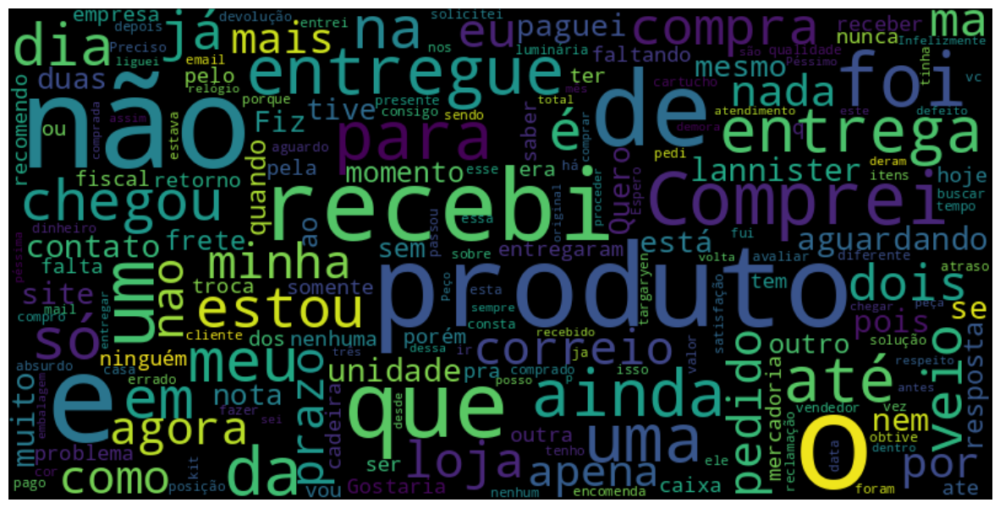

In [81]:
# Nuvem de palavras dos comentários dos clientes cujo review é 1 no df_rj
reviews_1 = ' '.join(reviews_1)
wordcloud = WordCloud(width=800, height=400, max_font_size=110, collocations=False).generate(reviews_1)
plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [82]:
# Quanto as vendas de SP com nota 1 para o RJ representam no df_rj
df_rj_sp = df_rj[df_rj['seller_state'] == 'SP']
df_rj_sp_1 = df_rj_sp[df_rj_sp['review_score'] == 1].shape[0]/df_rj.shape[0]*100
df_rj_sp_1

13.258869908015768

In [83]:
# Quanto em valor de vendas totais de SP para o RJ no df_rj com nota 1
df_rj_sp[df_rj_sp['review_score'] == 1]['payment_value'].sum()/df_rj['payment_value'].sum()*100

17.83443666501161

In [84]:
# Tempo médio de entrega de SP para o RJ no df_rj com nota 1
df_rj_sp[df_rj_sp['review_score'] == 1]['tempo_entrega'].mean()


25.789066813914964

In [85]:
# Tempo médio de entrega de SP para o RJ no df_rj
df_rj_sp['tempo_entrega'].mean()

15.64752354907323

In [86]:
# Atraso médio de SP para o RJ no df_rj com nota 1
df_rj_sp[df_rj_sp['review_score'] == 1]['atraso'].mean()

-1.0287134180011044

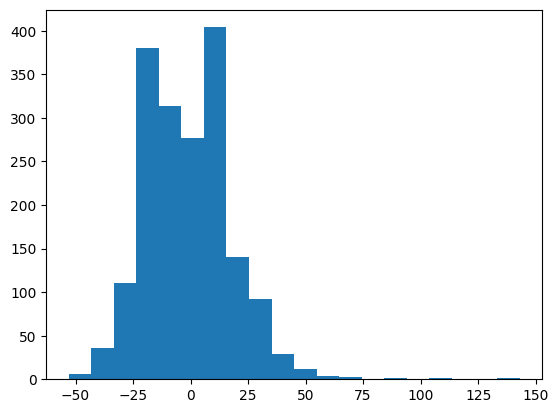

In [87]:
# Plotar um histograma com o atraso de SP para o RJ no df_rj com nota 1
plt.hist(df_rj_sp[df_rj_sp['review_score'] == 1]['atraso'], bins=20)
plt.show()

In [88]:
# Quantas vendas de SP para o RJ no df_rj com nota 1 tem atraso maior que 0
df_rj_sp[df_rj_sp['review_score'] == 1][df_rj_sp['atraso'] > 0].shape[0]/df_rj.shape[0]*100


<ipython-input-88-6d775feba234>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_rj_sp[df_rj_sp['review_score'] == 1][df_rj_sp['atraso'] > 0].shape[0]/df_rj.shape[0]*100


5.657030223390276

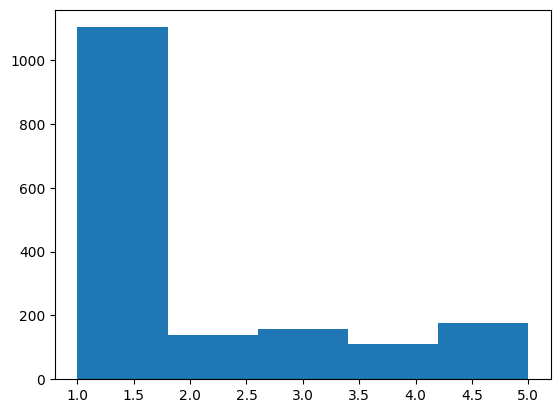

In [89]:
# Qual a distribuição das reviews das compras com atraso maior que 0 no df_rj
plt.hist(df_rj[df_rj['atraso'] > 0]['review_score'], bins=5)
plt.show()


In [90]:
# Qual é o atraso médio quando a origem é o RJ no df_rj
df_rj_rj = df_rj[df_rj['seller_state'] == 'RJ']
df_rj_rj['atraso'].mean()

-13.202690582959642

In [91]:
# qual é o atraso médio quando a origem é o SP no df_rj
df_rj_sp['atraso'].mean()

-11.231844424187177

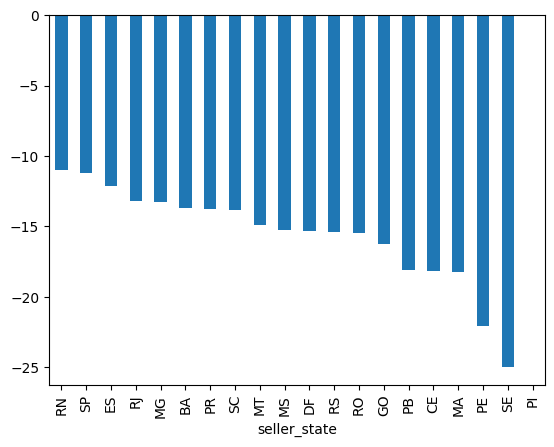

In [92]:
# Plotar um gráfico com atraso médio por estado de origem no df_rj ordenado do maior para o menor
df_rj.groupby('seller_state')['atraso'].mean().sort_values(ascending=False).plot(kind='bar')
plt.show()

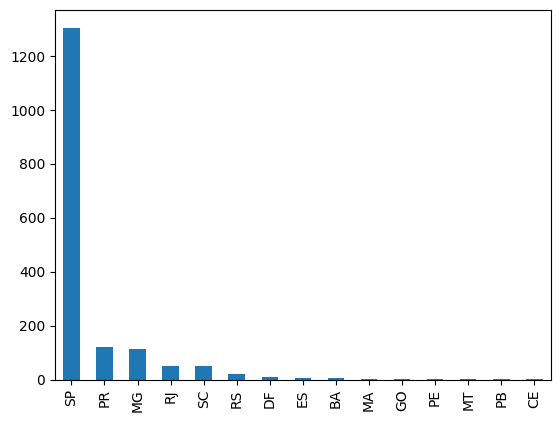

In [93]:
# Plotar o gráfico de quantidade de vendas por estado de origem no df_rj cujo atraso é maior que 0
df_rj[df_rj['atraso'] > 0]['seller_state'].value_counts().plot(kind='bar')
plt.show()


In [94]:
# percentual da quantidade de vendas por estado de origem no df_rj cujo atraso é maior que 0
df_rj[df_rj['atraso'] > 0]['seller_state'].value_counts(normalize=True)*100


SP    77.323860
PR     7.164002
MG     6.690349
RJ     2.901125
SC     2.901125
RS     1.124926
DF     0.532860
ES     0.414446
BA     0.236827
MA     0.177620
GO     0.177620
PE     0.118413
MT     0.118413
PB     0.059207
CE     0.059207
Name: seller_state, dtype: float64

In [95]:
# o percentual de atraso maior do que 0 em relação ao total de vendas por estado de origem no df_rj
df_rj[df_rj['atraso'] > 0]['seller_state'].value_counts()/df_rj['seller_state'].value_counts()*100



BA     4.123711
CE    10.000000
DF     8.108108
ES     9.090909
GO     4.687500
MA     7.142857
MG     8.054170
MS          NaN
MT    14.285714
PB    11.111111
PE     3.773585
PI          NaN
PR    10.297872
RJ     4.249783
RN          NaN
RO          NaN
RS     6.761566
SC     8.812950
SE          NaN
SP    12.854331
Name: seller_state, dtype: float64

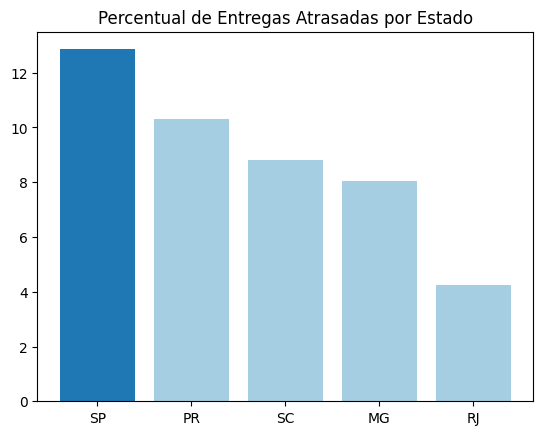

In [96]:
# Grafico com o percentual de atraso maior do que 0 em relação ao total de vendas por estado de origem no df_rj, ordenado do maior para o menor. Considere somente os top 5 estados que mais vendem
top_5_estados = df_rj['seller_state'].value_counts().head(5).index
df_rj_top_5 = df_rj[df_rj['seller_state'].isin(top_5_estados)]
atraso_estado = df_rj_top_5[df_rj_top_5['atraso'] > 0]['seller_state'].value_counts()/df_rj_top_5['seller_state'].value_counts()*100
atraso_estado = atraso_estado.sort_values(ascending=False)


plt.bar(atraso_estado.index, atraso_estado.values, color='#a5cee2')


indice_destacado =  atraso_estado.index.get_loc('SP')


cores = ['#a5cee2' if i != indice_destacado else '#1f78b4' for i in range(len(atraso_estado.index))]
plt.bar(atraso_estado.index[indice_destacado], atraso_estado.values[indice_destacado], color=cores[indice_destacado])
plt.title('Percentual de Entregas Atrasadas por Estado')


plt.show()


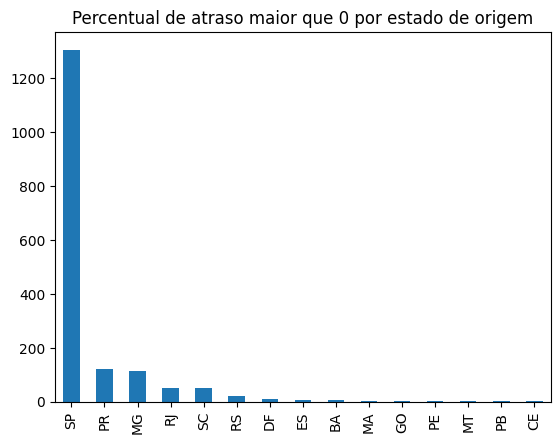

In [97]:
# fazer o gráfico dos resultados da célula anterior ordenado do maior para o menor com titulo e label para os eixos x e y
df_rj[df_rj['atraso'] > 0]['seller_state'].value_counts()/df_rj['seller_state'].value_counts()*100
df_rj[df_rj['atraso'] > 0]['seller_state'].value_counts().sort_values(ascending=False).plot(kind='bar')
plt.title('Percentual de atraso maior que 0 por estado de origem')
plt.show()

In [98]:
df_rj.shape

(15220, 52)

In [99]:
# Qual é o percentual de vendas por estado no df_rj tem atraso maior que 0
df_rj[df_rj['atraso'] > 0]['seller_state'].value_counts(normalize=True)*100


SP    77.323860
PR     7.164002
MG     6.690349
RJ     2.901125
SC     2.901125
RS     1.124926
DF     0.532860
ES     0.414446
BA     0.236827
MA     0.177620
GO     0.177620
PE     0.118413
MT     0.118413
PB     0.059207
CE     0.059207
Name: seller_state, dtype: float64

In [100]:
# Qual é o percentual de vendas de cada estado que tem atraso maior que 0 no df_rj
perc_atraso_total_vendas = df_rj[df_rj['atraso'] > 0]['seller_state'].value_counts()/df_rj['seller_state'].value_counts()
perc_atraso_total_vendas.sort_values(ascending=False)*100

MT    14.285714
SP    12.854331
PB    11.111111
PR    10.297872
CE    10.000000
ES     9.090909
SC     8.812950
DF     8.108108
MG     8.054170
MA     7.142857
RS     6.761566
GO     4.687500
RJ     4.249783
BA     4.123711
PE     3.773585
MS          NaN
PI          NaN
RN          NaN
RO          NaN
SE          NaN
Name: seller_state, dtype: float64

<ipython-input-101-34520a1cb942>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rj_sp_atraso['data'] = df_rj_sp_atraso['order_purchase_timestamp'].dt.date


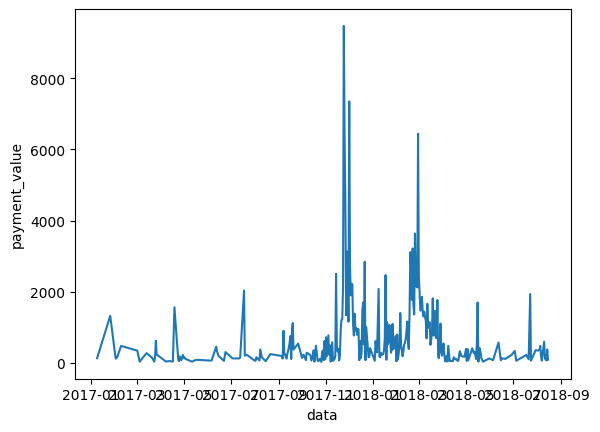

In [101]:
#Grafico de linha em seaborn ao longo das datas com as vendas do estado  de SP com atraso maior do que 0 no df_rj. Incluir uma linha de tendencia
df_rj_sp_atraso = df_rj_sp[df_rj_sp['atraso'] > 0]
df_rj_sp_atraso['data'] = df_rj_sp_atraso['order_purchase_timestamp'].dt.date
df_rj_sp_atraso = df_rj_sp_atraso.groupby('data')['payment_value'].sum().reset_index()
sns.lineplot(x='data', y='payment_value', data=df_rj_sp_atraso)
plt.show()


In [102]:
# quais os tipos de produtos que o cliente do RJ compra
df_rj['product_category_name'].value_counts().head(10)

cama_mesa_banho           1761
moveis_decoracao          1151
beleza_saude              1098
esporte_lazer             1082
informatica_acessorios    1032
utilidades_domesticas      929
relogios_presentes         878
ferramentas_jardim         692
brinquedos                 595
cool_stuff                 532
Name: product_category_name, dtype: int64

In [103]:
# em quais periodos do dia o cliente do RJ mais compra
# (compra mais a tarde)
df_rj['periodo_compra'] = df_rj['order_purchase_timestamp'].dt.hour
df_rj['periodo_compra'] = pd.cut(df_rj['periodo_compra'], bins=[0, 6, 12, 18, 24], labels=['madrugada', 'manha', 'tarde', 'noite'])
df_rj['periodo_compra'].value_counts(normalize=True)*100

<ipython-input-103-a940ef24b929>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rj['periodo_compra'] = df_rj['order_purchase_timestamp'].dt.hour
<ipython-input-103-a940ef24b929>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rj['periodo_compra'] = pd.cut(df_rj['periodo_compra'], bins=[0, 6, 12, 18, 24], labels=['madrugada', 'manha', 'tarde', 'noite'])


tarde        39.629404
noite        29.072834
manha        27.882600
madrugada     3.415162
Name: periodo_compra, dtype: float64

<ipython-input-104-04bc69e57cef>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rj['mes_compra'] = df_rj['order_purchase_timestamp'].dt.month


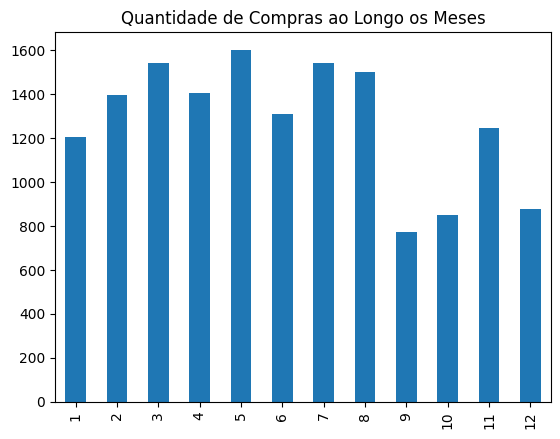

In [104]:
# faça um grafico com o numero de compras por mes do cliente do RJ mais compra, ordenado por mes
df_rj['mes_compra'] = df_rj['order_purchase_timestamp'].dt.month
df_rj['mes_compra'].value_counts().sort_index().plot(kind='bar')
plt.title('Quantidade de Compras ao Longo os Meses')
plt.show()


In [105]:
#  O percentual do numero de compras por mes do cliente do RJ mais compra
# (presenteia mais no mês das maes e dos pais. Preocupado com a familia)
df_rj['mes_compra'].value_counts(normalize=True).sort_index()*100


1      7.890933
2      9.145861
3     10.111695
4      9.218134
5     10.519054
6      8.580815
7     10.105125
8      9.842313
9      5.052562
10     5.584757
11     8.186597
12     5.762155
Name: mes_compra, dtype: float64

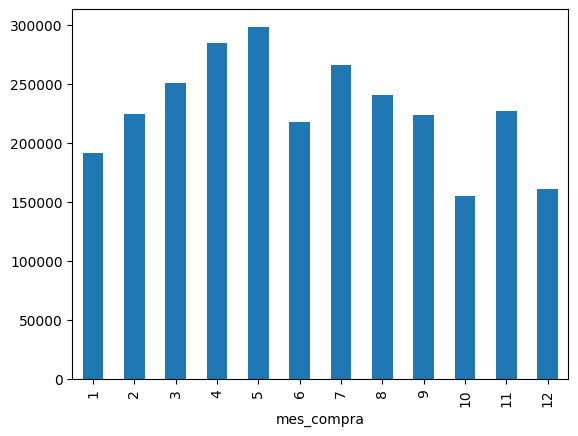

In [106]:
# faça um grafico com o valor das compras por mes do cliente do RJ mais compra, ordenado por mes
df_rj.groupby('mes_compra')['payment_value'].sum().sort_index().plot(kind='bar')
plt.show()


In [107]:
# em quais dias da semana o cliente do RJ mais compra
df_rj['dia_semana_compra'] = df_rj['order_purchase_timestamp'].dt.dayofweek
df_rj['dia_semana_compra'] = df_rj['dia_semana_compra'].map({0:'segunda', 1:'terca', 2:'quarta', 3:'quinta', 4:'sexta', 5:'sabado', 6:'domingo'})
df_rj['dia_semana_compra'].value_counts(normalize=True)*100

<ipython-input-107-329139de28e4>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rj['dia_semana_compra'] = df_rj['order_purchase_timestamp'].dt.dayofweek
<ipython-input-107-329139de28e4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rj['dia_semana_compra'] = df_rj['dia_semana_compra'].map({0:'segunda', 1:'terca', 2:'quarta', 3:'quinta', 4:'sexta', 5:'sabado', 6:'domingo'})


terca      16.320631
segunda    15.709593
quarta     15.663601
quinta     14.421813
sexta      14.421813
domingo    11.977661
sabado     11.484888
Name: dia_semana_compra, dtype: float64

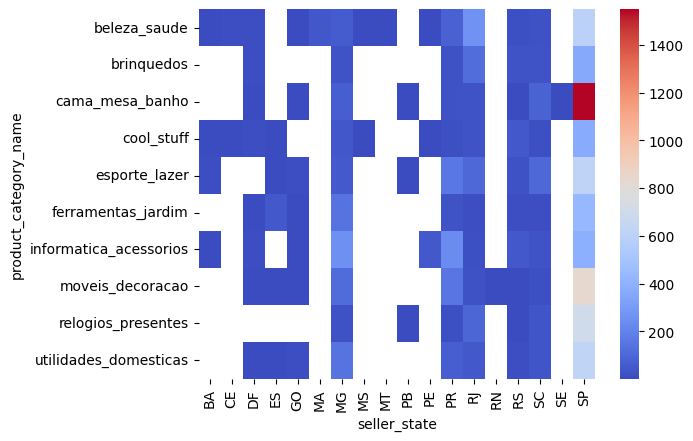

In [108]:
# Faça um heatmap com a quantidade de compras, com o estado de origem e os top 10 tipos de produto mais vendidos
heatmap = df_rj[df_rj['product_category_name'].isin(df_rj['product_category_name'].value_counts().head(10).index)].groupby(['product_category_name', 'seller_state']).size().unstack()
#heatmap = df_rj.groupby(['seller_state', 'product_category_name']).size().unstack()
sns.heatmap(heatmap, cmap='coolwarm')
plt.show()

In [109]:
# qual é o meio de pagamento mais comum do cliente do RJ
df_rj['payment_type'].value_counts(normalize=True)*100


credit_card    75.795007
boleto         16.478318
voucher         6.353482
debit_card      1.373193
Name: payment_type, dtype: float64

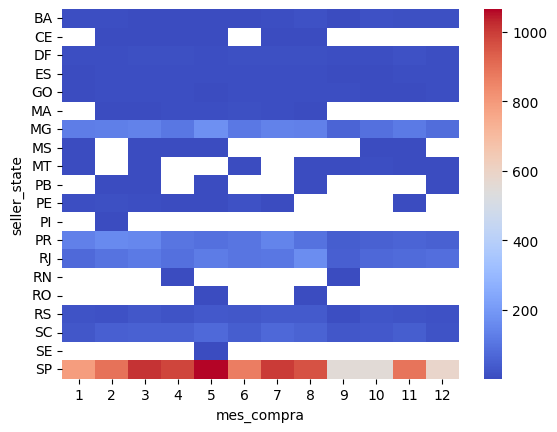

In [110]:
# Faça um heatmap com a quantidade de compras, com o estado de origem e o mês da compra
heatmap = df_rj.groupby(['seller_state', 'mes_compra']).size().unstack()
sns.heatmap(heatmap, cmap='coolwarm')
plt.show()

In [111]:
# quanto representa os 5 maiores estado vendedor para o RJ
df_rj['seller_state'].value_counts(normalize=True).head(5)*100


SP    66.754271
MG     9.218134
PR     7.720105
RJ     7.575558
SC     3.653088
Name: seller_state, dtype: float64

In [112]:
#  quanto representa em valor da vendas os 5 maiores estado vendedor para o RJ
df_rj.groupby('seller_state')['payment_value'].sum().sort_values(ascending=False).head(5)/df_rj['payment_value'].sum()*100


seller_state
SP    64.503576
RJ     8.625983
MG     8.122994
PR     7.885657
SC     3.896347
Name: payment_value, dtype: float64

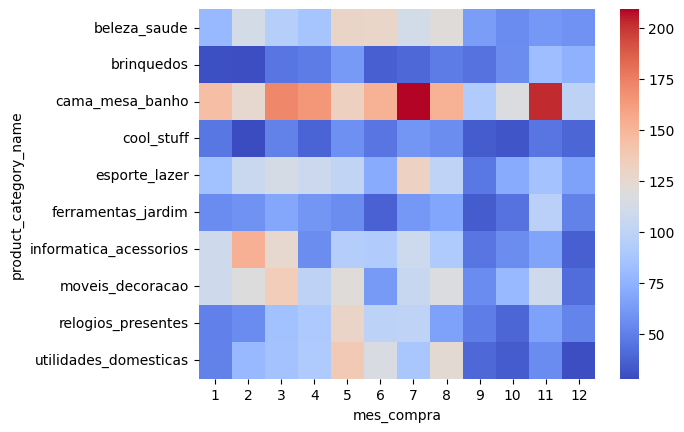

In [113]:
# Faça um heatmap com a quantidade de compras com somente os top 10 tipos de produtos mais vendidos e o mês da compra
heatmap = df_rj[df_rj['product_category_name'].isin(df_rj['product_category_name'].value_counts().head(10).index)].groupby(['product_category_name', 'mes_compra']).size().unstack()
sns.heatmap(heatmap, cmap='coolwarm')
plt.show()

In [114]:
#quanto representa os 10 maiores produtos vendidos para o RJ
df_rj['product_category_name'].value_counts(normalize=True).head(10)*100


cama_mesa_banho           11.747832
moveis_decoracao           7.678452
beleza_saude               7.324883
esporte_lazer              7.218145
informatica_acessorios     6.884590
utilidades_domesticas      6.197465
relogios_presentes         5.857238
ferramentas_jardim         4.616411
brinquedos                 3.969313
cool_stuff                 3.549033
Name: product_category_name, dtype: float64

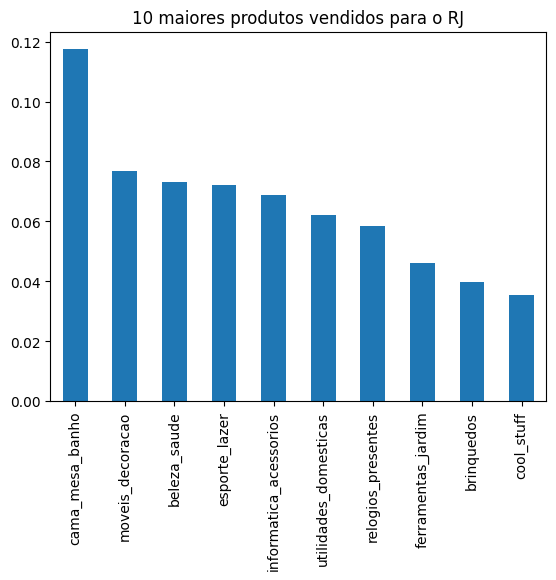

In [115]:
#Grafico com a participação dos 10 maiores produtos vendidos para o RJ com titulo
df_rj['product_category_name'].value_counts(normalize=True).head(10).plot(kind='bar')
plt.title('10 maiores produtos vendidos para o RJ')
plt.show()

In [116]:
#quanto representa os 10 maiores produtos vendidos no Brasil
df['product_category_name'].value_counts(normalize=True).head(10)*100


cama_mesa_banho           10.245257
beleza_saude               8.599547
esporte_lazer              7.733020
moveis_decoracao           7.560925
informatica_acessorios     7.009184
utilidades_domesticas      6.339831
relogios_presentes         5.328018
telefonia                  4.057630
ferramentas_jardim         3.941747
automotivo                 3.767058
Name: product_category_name, dtype: float64

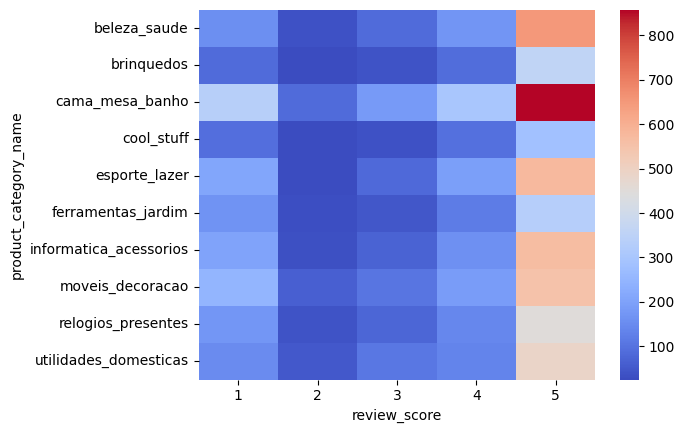

In [117]:
# Faça um heatmap com a quantidade de compras com somente os top 10 tipos de produtos mais vendidos e o review do cliente
heatmap = df_rj[df_rj['product_category_name'].isin(df_rj['product_category_name'].value_counts().head(10).index)].groupby(['product_category_name', 'review_score']).size().unstack()
sns.heatmap(heatmap, cmap='coolwarm')
plt.show()

In [118]:
# Distribuição doa top 10 produtos mais vendidos para o RJ com review 1
df_rj[df_rj['product_category_name'].isin(df_rj['product_category_name'].value_counts().head(10).index)][df_rj['review_score'] == 1]['product_category_name'].value_counts(normalize=True)*100


<ipython-input-118-472f493b4863>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_rj[df_rj['product_category_name'].isin(df_rj['product_category_name'].value_counts().head(10).index)][df_rj['review_score'] == 1]['product_category_name'].value_counts(normalize=True)*100


cama_mesa_banho           18.498067
moveis_decoracao          13.694092
esporte_lazer             11.430149
informatica_acessorios    11.154059
relogios_presentes         9.552733
ferramentas_jardim         9.166207
beleza_saude               8.558807
utilidades_domesticas      8.227499
cool_stuff                 5.024848
brinquedos                 4.693539
Name: product_category_name, dtype: float64

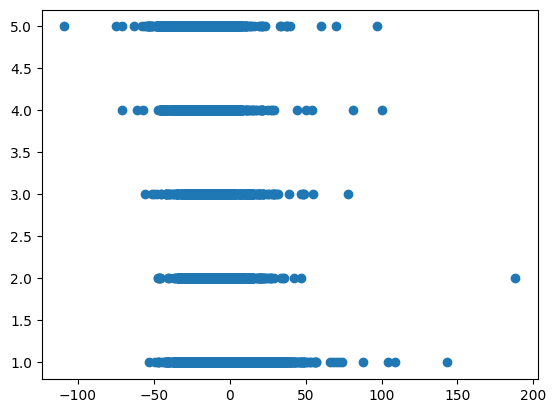

In [119]:
# grafico de pontos com o atraso e o review do cliente no RJ
plt.scatter(df_rj['atraso'], df_rj['review_score'])
plt.show()

<ipython-input-120-356bf6ae30c4>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rj['photos'] = df_rj['product_photos_qty']


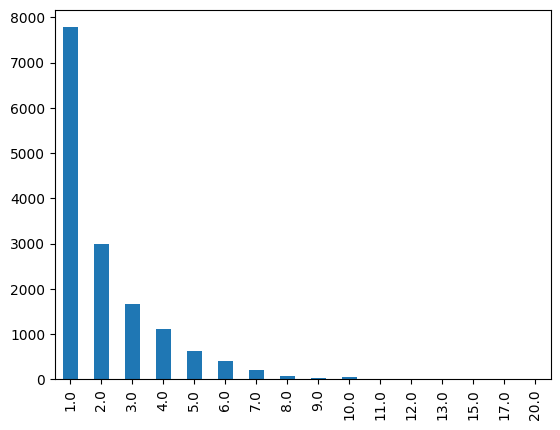

In [120]:
# Faça um gráfico com  a quantidade de compras pelo número de photos
df_rj['photos'] = df_rj['product_photos_qty']
df_rj['photos'].value_counts().sort_index().plot(kind='bar')
plt.show()

In [121]:
# Cria um df com dados do df_rj com os estados, a review média, o atraso médio, a quantidade de produtos vendidos, o valor total vendido e o valor do frete medio
df_rj_estado = df_rj.groupby('seller_state').agg({'review_score':'mean', 'atraso':'mean', 'product_category_name':'count', 'payment_value':'sum', 'freight_value':'mean'}).reset_index()
df_rj_estado


,seller_state,review_score,atraso,product_category_name,payment_value,freight_value
0,BA,4.061856,-13.684211,97,43082.74,31.480825
1,CE,4.500000,-18.200000,10,4514.32,59.746000
2,DF,3.729730,-15.292453,108,16744.36,20.783604
3,ES,3.896104,-12.133333,73,17970.64,26.111688
4,GO,4.375000,-16.238095,63,7860.49,24.725781
5,MA,4.309524,-18.261905,42,4743.31,29.748095
6,MG,3.979330,-13.243343,1368,222674.68,24.565723
7,MS,4.888889,-15.222222,9,2025.90,22.004444
8,MT,4.000000,-14.928571,14,2758.15,33.793571
9,PB,4.555556,-18.125000,8,5899.75,58.348889


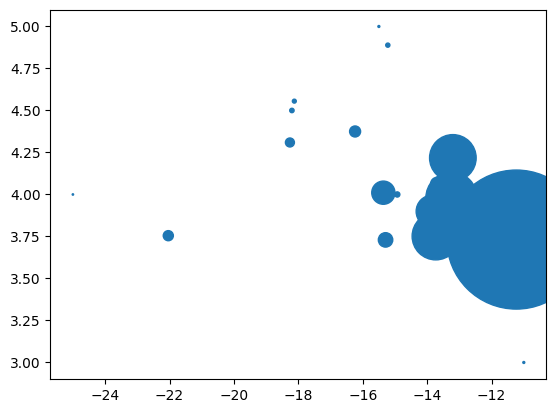

In [122]:
# Criar um grafico de dispersao entre o review e o atraso do df_rj com o tamanho do ponto proporcional a quantidade de produtos vendidos
plt.scatter(df_rj_estado['atraso'], df_rj_estado['review_score'], s=df_rj_estado['product_category_name'])
plt.show()

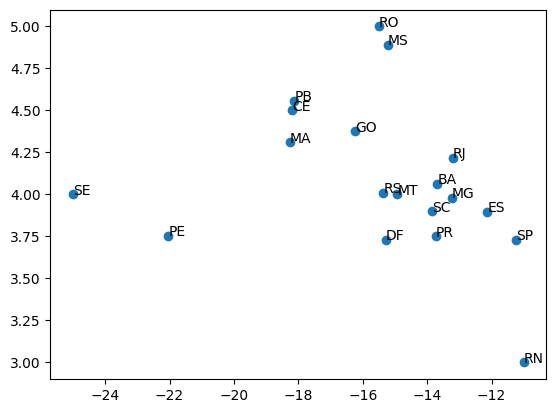

In [123]:
# Criar um grafico de dispersao entre o review e o atraso do df_rj_estado com o rotudo dos pontos
plt.scatter(df_rj_estado['atraso'], df_rj_estado['review_score'])
for i, txt in enumerate(df_rj_estado['seller_state']):
    plt.annotate(txt, (df_rj_estado['atraso'].iloc[i], df_rj_estado['review_score'].iloc[i]))
plt.show()

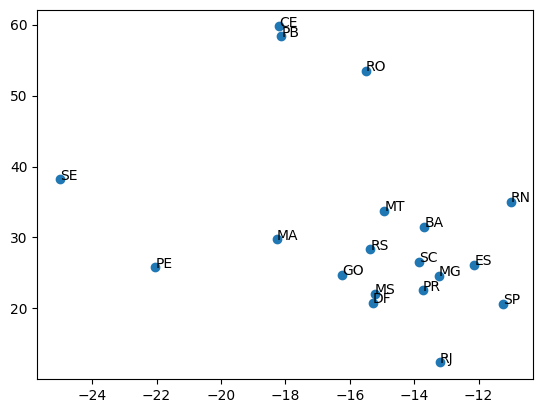

In [124]:
# Criar um grafico de dispersao entre o frete e o atraso do df_rj_estado com o rotudo dos pontos
plt.scatter(df_rj_estado['atraso'], df_rj_estado['freight_value'])
for i, txt in enumerate(df_rj_estado['seller_state']):
    plt.annotate(txt, (df_rj_estado['atraso'].iloc[i], df_rj_estado['freight_value'].iloc[i]))
plt.show()

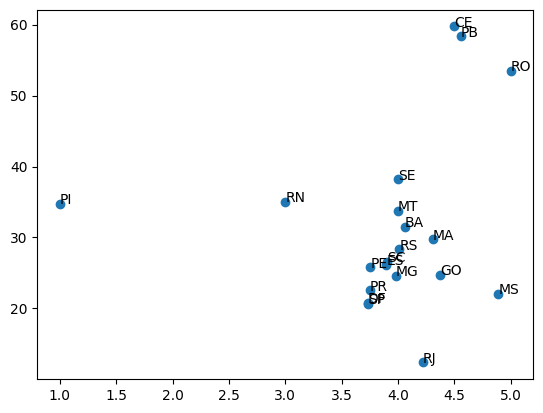

In [125]:
# Criar um grafico de dispersao entre o frete e o review do df_rj_estado com o rotudo dos pontos
plt.scatter(df_rj_estado['review_score'], df_rj_estado['freight_value'])
for i, txt in enumerate(df_rj_estado['seller_state']):
    plt.annotate(txt, (df_rj_estado['review_score'].iloc[i], df_rj_estado['freight_value'].iloc[i]))
plt.show()

In [126]:
#REview medio de vendas do RJ no df_rj
review_medio_rj = df_rj[df_rj['seller_state'] == 'RJ']['review_score'].mean()

# Somar as colunas de Preço e Frete do df_rj
print(df_rj[df_rj['seller_state'] == 'RJ']['price'].sum())

# Somar as colunas de Preço e Frete do df_rj com review menor e igual a 3 e do estado de sp
print(df_rj[(df_rj['review_score'] <= review_medio_rj) & (df_rj['seller_state'] == 'SP')]['price'].sum())

#Vendas Totais no RJ
print(df_rj['price'].sum())

#Vendas de SP no RJ
print(df_rj[df_rj['seller_state'] == 'SP']['price'].sum())

# Tamanho do mercado
df_rj[(df_rj['review_score'] <= review_medio_rj) & (df_rj['seller_state'] == 'SP')]['price'].sum() - df_rj[df_rj['seller_state'] == 'RJ']['price'].sum()

190728.2
577573.81
1891827.34
1149462.92


386845.61000000004

In [129]:
# Mapa com as locais para onde foram vendidos os produtos da Olist
#Plotar no mapa do Rio de Janeiro a quantidade de vendas

#Filtar os NaN das colunas de geolocation_lat e geolocation_lng
df_rj_filtered = df_rj.dropna(subset=['geolocation_lat', 'geolocation_lng'])

# Filtrar o CEP entre 23799-23999
df_rj_filtered = df_rj_filtered[(df_rj['customer_zip_code_prefix'] >= 20000) & (df_rj['customer_zip_code_prefix'] <= 23799)]

# Create a map centered on Rio de Janeiro
map_rj = folium.Map(location=[-22.9068, -43.1729], zoom_start=12)

# Add markers for each sale location
for index, row in df_rj_filtered.iterrows():
    folium.Marker([row['geolocation_lat'], row['geolocation_lng']]).add_to(map_rj)


# Display the map
map_rj


<ipython-input-129-b1c1339ae571>:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_rj_filtered = df_rj_filtered[(df_rj['customer_zip_code_prefix'] >= 20000) & (df_rj['customer_zip_code_prefix'] <= 23799)]


In [128]:
df_rj.columns

Index(['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'prazo_estimado', 'prazo_realizado', 'atraso', 'customer_unique_id',
       'customer_zip_code_prefix', 'customer_city', 'customer_state',
       'order_item_id', 'product_id', 'seller_id', 'shipping_limit_date',
       'price', 'freight_value', 'seller_zip_code_prefix', 'seller_city',
       'seller_state', 'payment_sequential', 'payment_type',
       'payment_installments', 'payment_value', 'review_id', 'review_score',
       'review_comment_title', 'review_comment_message',
       'review_creation_date', 'review_answer_timestamp',
       'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'geolocation_zip_code_prefix', '

In [155]:
# Mapa com as locais para onde foram vendidos os produtos da Olist . O tamanho das bolas representam a quantidade de vendas
# Criar um mapa centrado no Rio de Janeiro
rio_map = folium.Map(location=[-22.9068, -43.1729], zoom_start=11)

# Agrupar as vendas por latitude e longitude e contar o número de vendas em cada localização
vendas_por_localizacao = df_rj_filtered.groupby(['geolocation_lat', 'geolocation_lng']).size().reset_index(name='count')

# Iterar sobre as localizações e adicionar círculos ao mapa, onde o tamanho do círculo representa a quantidade de vendas
for index, row in vendas_por_localizacao.iterrows():
    folium.CircleMarker(
        location=[row['geolocation_lat'], row['geolocation_lng']],
        radius=row['count']/2,  # Ajuste o multiplicador conforme necessário para controlar o tamanho dos círculos
        color='blue',
        fill=True,
        fill_color='blue'
    ).add_to(rio_map)

# Salvar o mapa como um arquivo HTML
rio_map


In [144]:
# Mapa com as locais para onde foram vendidos os produtos da Olist . O tamanho das bolas representam o valor das vendas
# Criar um mapa centrado no Rio de Janeiro
rio_map = folium.Map(location=[-22.9068, -43.1729], zoom_start=11)

# Agrupar as vendas por latitude e longitude e contar o número de vendas em cada localização
valor_por_localizacao = df_rj_filtered.groupby(['geolocation_lat', 'geolocation_lng'])['payment_value'].sum().reset_index(name='total_valor_vendas')

# Iterar sobre as localizações e adicionar círculos ao mapa, onde o tamanho do círculo representa a quantidade de vendas
for index, row in valor_por_localizacao.iterrows():
    folium.CircleMarker(
        location=[row['geolocation_lat'], row['geolocation_lng']],
        radius=row['total_valor_vendas']/1000,  # Ajuste o multiplicador conforme necessário para controlar o tamanho dos círculos
        color='blue',
        fill=True,
        fill_color='blue'
    ).add_to(rio_map)

# Salvar o mapa como um arquivo HTML
rio_map


In [154]:
# Mapa com as locais para onde foram vendidos os produtos da Olist . O tamanho das bolas representam o review médio

# Criar um mapa centrado no Rio de Janeiro
rio_map = folium.Map(location=[-22.9068, -43.1729], zoom_start=11)

# Agrupar as vendas por latitude e longitude e contar o número de vendas em cada localização
review_por_localizacao = df_rj_filtered.groupby(['geolocation_lat', 'geolocation_lng'])['review_score'].mean().reset_index(name='review')

# Iterar sobre as localizações e adicionar círculos ao mapa, onde o tamanho do círculo representa a quantidade de vendas
for index, row in review_por_localizacao.iterrows():
    folium.CircleMarker(
        location=[row['geolocation_lat'], row['geolocation_lng']],
        radius=row['review']**2,  # Ajuste o multiplicador conforme necessário para controlar o tamanho dos círculos
        color='blue',
        fill=True,
        fill_color='blue'
    ).add_to(rio_map)

# Salvar o mapa como um arquivo HTML
rio_map

In [161]:
# Mapa com as locais para onde foram vendidos os produtos da Olist . O tamanho das bolas representam a quantidade de vendas. Verde representa SP e Azul, RJ.

# Criar um mapa centrado no Rio de Janeiro
rio_map = folium.Map(location=[-22.9068, -43.1729], zoom_start=11)

# Agrupar as vendas por latitude e longitude e contar o número de vendas em cada localização
vendas_estado = df_rj_filtered.groupby(['geolocation_lat', 'geolocation_lng', 'seller_state']).size().reset_index(name='count')

# Iterar sobre as localizações e adicionar círculos ao mapa, onde o tamanho do círculo representa a quantidade de vendas
for index, row in vendas_estado.iterrows():
    if row['seller_state'] == 'SP':
        # Destacar as vendas de São Paulo com cor verde
        cor = 'green'
    else:
        # Outras vendas em azul
        cor = 'blue'
    folium.CircleMarker(
        location=[row['geolocation_lat'], row['geolocation_lng']],
        radius=row['count'],  # Ajuste o multiplicador conforme necessário para controlar o tamanho dos círculos
        color=cor,
        fill=True,
        fill_color=cor
    ).add_to(rio_map)

# Salvar o mapa como um arquivo HTML
rio_map

In [162]:
# Mapa com as locais para onde foram vendidos os produtos da Olist . O tamanho das bolas representam o review médio

# Criar um mapa centrado no Rio de Janeiro
rio_map = folium.Map(location=[-22.9068, -43.1729], zoom_start=11)

# Agrupar as vendas por latitude e longitude e contar o número de vendas em cada localização
review_por_localizacao = df_rj_filtered.groupby(['geolocation_lat', 'geolocation_lng'])['review_score'].mean().reset_index(name='review')

# Iterar sobre as localizações e adicionar círculos ao mapa, onde o tamanho do círculo representa a quantidade de vendas
for index, row in review_por_localizacao.iterrows():
    if row['review'] > 3:
        # Destacar as vendas de São Paulo com cor verde
        cor = 'blue'
    else:
        # Outras vendas em azul
        cor = 'red'
    folium.CircleMarker(
        location=[row['geolocation_lat'], row['geolocation_lng']],
        radius=row['review']**2,  # Ajuste o multiplicador conforme necessário para controlar o tamanho dos círculos
        color=cor,
        fill=True,
        fill_color=cor
    ).add_to(rio_map)

# Salvar o mapa como um arquivo HTML
rio_map

In [163]:
# Mapa com as locais para onde foram vendidos os produtos da Olist . O tamanho das bolas representam o review médio

# Criar um mapa centrado no Rio de Janeiro
rio_map = folium.Map(location=[-22.9068, -43.1729], zoom_start=11)

#DF só com vendas oriundas de SP
df_rj_sp = df_rj_filtered[(df_rj['seller_state'] == 'SP' )]

# Agrupar as vendas por latitude e longitude e contar o número de vendas em cada localização
review_sp = df_rj_sp.groupby(['geolocation_lat', 'geolocation_lng'])['review_score'].mean().reset_index(name='review')

# Iterar sobre as localizações e adicionar círculos ao mapa, onde o tamanho do círculo representa a quantidade de vendas
for index, row in review_sp.iterrows():
    if row['review'] > 3:
        # Destacar as vendas de São Paulo com cor verde
        cor = 'blue'
    else:
        # Outras vendas em azul
        cor = 'red'
    folium.CircleMarker(
        location=[row['geolocation_lat'], row['geolocation_lng']],
        radius=row['review']**2,  # Ajuste o multiplicador conforme necessário para controlar o tamanho dos círculos
        color=cor,
        fill=True,
        fill_color=cor
    ).add_to(rio_map)

# Salvar o mapa como um arquivo HTML
rio_map

<ipython-input-163-7c5b452d9784>:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_rj_sp = df_rj_filtered[(df_rj['seller_state'] == 'SP' )]
